In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.graph_objects as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
import plotly.express as px
from plotly.subplots import make_subplots

import re

from wordcloud import WordCloud

from collections import Counter

import nltk

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [43]:
# For Google Colab

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [2]:
FILE = 'stopwords.xlsx'

X0 = 'Final Data'
X1 = 'Short description'
X2 = 'Description'
X3 = 'Caller'
Y = 'Assignment group'

X4 = 'Word Count'
X5 = 'Bigrams'

In [3]:
data = pd.read_excel(FILE, engine='openpyxl')
data.head()

,Unnamed: 0,Short description,Description,Caller,Assignment group
0,0,login issue,verified user details employee manager checked...,spxjnwir pjlcoqds,GRP_0
1,1,outlook,received hello team meetings skype meetings et...,hmjdrvpb komuaywn,GRP_0
2,2,nt log vpn,received hi log vpn best,eylqgodm ybqkwiam,GRP_0
3,3,unable access hr tool page,unable access hr tool page,xbkucsvz gcpydteq,GRP_0
4,4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8492 entries, 0 to 8491
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Unnamed: 0         8492 non-null   int64 
 1   Short description  8478 non-null   object
 2   Description        8425 non-null   object
 3   Caller             8492 non-null   object
 4   Assignment group   8492 non-null   object
dtypes: int64(1), object(4)
memory usage: 331.8+ KB


## Working with duplication of data, row wise as well as column wise

### Row wise duplication
Find all duplicate checking with X1, X2 and Y have same.

In [5]:
duplicate = data[data.duplicated([X1, X2, Y])]

In [6]:
duplicate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1769 entries, 15 to 8481
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Unnamed: 0         1769 non-null   int64 
 1   Short description  1763 non-null   object
 2   Description        1721 non-null   object
 3   Caller             1769 non-null   object
 4   Assignment group   1769 non-null   object
dtypes: int64(1), object(4)
memory usage: 82.9+ KB


In [7]:
data.drop(duplicate.index, inplace=True)

There are still data where X1 and X2 are same but target variable Y is different. Need to see what needs to be done for that. There are 16 such rows which has X1 and X2 same but Y different

In [8]:
confused = data[data.duplicated([X1, X2])]

In [9]:
def get_potential_wrong_labelled_data(short_desc):
    if str(confused[X1]).find(str(short_desc)) != -1:
        return True
    return False

potential_wrong_data = data[data.apply(lambda x: get_potential_wrong_labelled_data(x[X1]), axis=1)]

In [10]:
potential_wrong_data.sort_values([X1, X2])

,Unnamed: 0,Short description,Description,Caller,Assignment group
7781,7781,HostName,unable reach destination server offline,ctvaejbo mjcerqwo,GRP_12
8119,8119,abended job job scheduler bkwin HostName inc,received abended job job scheduler bkwin HostN...,ZkBogxib QsEJzdZO,GRP_5
8307,8307,abended job job scheduler bkwin HostName inc,received abended job job scheduler bkwin HostN...,ZkBogxib QsEJzdZO,GRP_8
1510,1510,able login,received hi sir maam refer screenshot help urgent,axdyfojg nyjlxbsk,GRP_0
8253,8253,able login ethics,able login ethics,juelbpyf ozvgnuwb,GRP_19
...,...,...,...,...,...
6902,6902,unable login,unable login switch company eu deu germany vhs...,wczegmok bgqoclvs,GRP_4
1436,1436,unable login ethics,received hello company apac company location u...,igdnsjhz awnftgev,GRP_23
4155,4155,unable login ethics,trying login ethics user gets following error ...,uwiqchfp hnsukjma,GRP_23
1521,1521,unable login ethics,unable login ethics,ekracmdp yphqstfj,GRP_0


In [11]:
potential_wrong_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73 entries, 47 to 8396
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Unnamed: 0         73 non-null     int64 
 1   Short description  73 non-null     object
 2   Description        73 non-null     object
 3   Caller             73 non-null     object
 4   Assignment group   73 non-null     object
dtypes: int64(1), object(4)
memory usage: 3.4+ KB


### Column wise duplication

This is required to check and as ultimately we are going to merge both of the columns in the end before feeding to model for training. This will help in removing unecessary redundancy of data which impacts the outcome. There are 3592 such rows

In [12]:
redundant_desc = data[data.apply(lambda x: str(x[X2]).find(str(x[X1])) != -1, axis=1)]
redundant_desc

,Unnamed: 0,Short description,Description,Caller,Assignment group
0,0,login issue,verified user details employee manager checked...,spxjnwir pjlcoqds,GRP_0
1,1,outlook,received hello team meetings skype meetings et...,hmjdrvpb komuaywn,GRP_0
3,3,unable access hr tool page,unable access hr tool page,xbkucsvz gcpydteq,GRP_0
4,4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
5,5,unable log engineering tool skype,unable log engineering tool skype,eflahbxn ltdgrvkz,GRP_0
...,...,...,...,...,...
8484,8484,hr tool etime option visitble,hr tool etime option visitble,tmopbken ibzougsd,GRP_0
8486,8486,tablet needs reimaged multiple issues crm wifi...,tablet needs reimaged multiple issues crm wifi...,cpmaidhj elbaqmtp,GRP_3
8488,8488,telephony software issue,telephony software issue,rbozivdq gmlhrtvp,GRP_0
8489,8489,vip windows password reset tifpdchb pedxruyf,vip windows password reset tifpdchb pedxruyf,oybwdsgx oxyhwrfz,GRP_0


In [13]:
def merge_data(short_desc, long_desc):
    if str(long_desc).find(str(short_desc)) != -1:
        return str(long_desc).lower()
    else:
        return (str(short_desc) + " " + str(long_desc)).lower()


data[X0] = data.apply(lambda x: merge_data(x[X1], x[X2]), axis=1)
data.head()

,Unnamed: 0,Short description,Description,Caller,Assignment group,Final Data
0,0,login issue,verified user details employee manager checked...,spxjnwir pjlcoqds,GRP_0,verified user details employee manager checked...
1,1,outlook,received hello team meetings skype meetings et...,hmjdrvpb komuaywn,GRP_0,received hello team meetings skype meetings et...
2,2,nt log vpn,received hi log vpn best,eylqgodm ybqkwiam,GRP_0,nt log vpn received hi log vpn best
3,3,unable access hr tool page,unable access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page
4,4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error


In [14]:
data.isna().sum()

Unnamed: 0            0
Short description     8
Description          19
Caller                0
Assignment group      0
Final Data            0
dtype: int64

Since we don't have any null in final data, it is not required to eliminate any rows completely.

In [15]:
data.reset_index(inplace=True)

## Add count of words

This is required to analyse what should be the length our model should take to understand it's group

In [16]:
data[X4] = data[X0].str.split(" ").apply(lambda x: len(x))

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6723 entries, 0 to 6722
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   index              6723 non-null   int64 
 1   Unnamed: 0         6723 non-null   int64 
 2   Short description  6715 non-null   object
 3   Description        6704 non-null   object
 4   Caller             6723 non-null   object
 5   Assignment group   6723 non-null   object
 6   Final Data         6723 non-null   object
 7   Word Count         6723 non-null   int64 
dtypes: int64(3), object(5)
memory usage: 420.3+ KB


## Target column analysis

Need to find how many classifications are there in the data since we are going to classify into this classes.

* Requires to check biasness in data provided, this will help in finding the approach on how to move forward

In [18]:
data[Y].unique()

array(['GRP_0', 'GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7',
       'GRP_8', 'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73'],
      dtype=object)

In [49]:
configure_plotly_browser_state()

agg_data = data.groupby(Y).size().reset_index(name = 'count')
fig = px.pie(agg_data, values='count', names=Y, title='Ticket Assignment')
fig.show()

In [50]:
configure_plotly_browser_state()

fig = px.pie(agg_data[agg_data[Y]!='GRP_0'], values='count', names=Y, title='Ticket Assignment non GRP_0')
fig.show()

In [51]:
configure_plotly_browser_state()

fig = px.histogram(data, x=Y, template='plotly_white', title='Tickets assigned to the group')
fig.update_xaxes(categoryorder='total descending').update_yaxes(title='Number of tickets')
fig.show()

In [52]:
configure_plotly_browser_state()

fig = px.histogram(data, x=X4, template='plotly_white', title='Words in the description')
fig.update_xaxes(categoryorder='total descending', title='Number of words (clipped at 1000 words)').update_yaxes(title='Number of complaints')
fig.show()

We have in total 74 groups in 7909 rows of data, and out of that 43% of data is just assigned to *GRP_0* which is clearly biased towards it. Few of the groups are so negligible that don't even have more than 10 of such rows. It would be better to split data into data with only *GRP_0* and *non-GRP_0* to make analysis much more precise

In [23]:
# def  clean_text(df, text_field, new_text_field_name):
#     df[new_text_field_name] = df[text_field].str.lower()
#     df[new_text_field_name] = df[new_text_field_name].apply(lambda elem: re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", "", elem))  
#     # remove numbers
#     df[new_text_field_name] = df[new_text_field_name].apply(lambda elem: re.sub(r"\d+", "", elem))
#     return df

In [24]:
data_non_0 = data[data[Y] != 'GRP_0']
data_0 = data[data[Y] == 'GRP_0']

In [54]:
configure_plotly_browser_state()

fig = make_subplots(rows=3, cols=1)
fig.add_trace(go.Box(x=data[X4], name='Desc All'), row=1, col=1)
fig.add_trace(go.Box(x=data_0[X4], name='Desc GRP0'), row=2, col=1)
fig.add_trace(go.Box(x=data_non_0[X4], name='Desc Non GRP0'), row=3, col=1)

fig.update_traces(showlegend=False)
fig.update_layout({
    'width':1024,
    'height':600,
    'title':'Description total words'
})
fig.show()

In [26]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
index,6723.0,4195.048342,2471.051066,0.0,2047.5,4184.0,6343.0,8491.0
Unnamed: 0,6723.0,4195.048342,2471.051066,0.0,2047.5,4184.0,6343.0,8491.0
Word Count,6723.0,21.410531,46.419620,1.0,6.0,12.0,22.0,1062.0


In [27]:
data_0.describe().T

,count,mean,std,min,25%,50%,75%,max
index,3103.0,4096.404125,2505.91850,0.0,1909.5,4044.0,6281.0,8489.0
Unnamed: 0,3103.0,4096.404125,2505.91850,0.0,1909.5,4044.0,6281.0,8489.0
Word Count,3103.0,13.986465,17.35204,1.0,4.0,9.0,18.0,262.0


In [28]:
data_non_0.describe().T

,count,mean,std,min,25%,50%,75%,max
index,3620.0,4279.604420,2437.938075,6.0,2166.75,4271.0,6391.25,8491.0
Unnamed: 0,3620.0,4279.604420,2437.938075,6.0,2166.75,4271.0,6391.25,8491.0
Word Count,3620.0,27.774309,60.468875,1.0,8.00,14.0,27.00,1062.0


From above **boxplot** *&* **description** it is clear that data from the group **GRP_0** has word count much less than any other group. This will be improved or some data loss will be there when gibberish data is cleansed from the given data

In [29]:
data[data[X4] <= 5]

,index,Unnamed: 0,Short description,Description,Caller,Assignment group,Final Data,Word Count
3,3,3,unable access hr tool page,unable access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,5
4,4,4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error,2
5,5,5,unable log engineering tool skype,unable log engineering tool skype,eflahbxn ltdgrvkz,GRP_0,unable log engineering tool skype,5
8,8,8,unable disable add ins outlook,unable disable add ins outlook,mdbegvct dbvichlg,GRP_0,unable disable add ins outlook,5
9,9,9,ticket update inplant,ticket update inplant,fumkcsji sarmtlhy,GRP_0,ticket update inplant,3
...,...,...,...,...,...,...,...,...
6700,8467,8467,etime time card update information,etime time card update information,tmopbken ibzougsd,GRP_0,etime time card update information,5
6707,8474,8474,robot HostName inactive,robot HostName inactive,rkupnshb gsmzfojw,GRP_8,robot hostname inactive,3
6710,8477,8477,ticket update inc user,ticket update inc user,fumkcsji sarmtlhy,GRP_0,ticket update inc user,4
6715,8484,8484,hr tool etime option visitble,hr tool etime option visitble,tmopbken ibzougsd,GRP_0,hr tool etime option visitble,5


In [30]:
cloud = WordCloud(random_state=1, collocations=False)

In [31]:
def plot_cloud(wordcloud_data):
    wordcloud = cloud.generate(wordcloud_data)
    # Set figure size
    plt.figure(figsize=(30, 20))
    # Display image
    plt.imshow(wordcloud, interpolation='bilinear') 
    # No axis details
    plt.axis("off")
    plt.show()

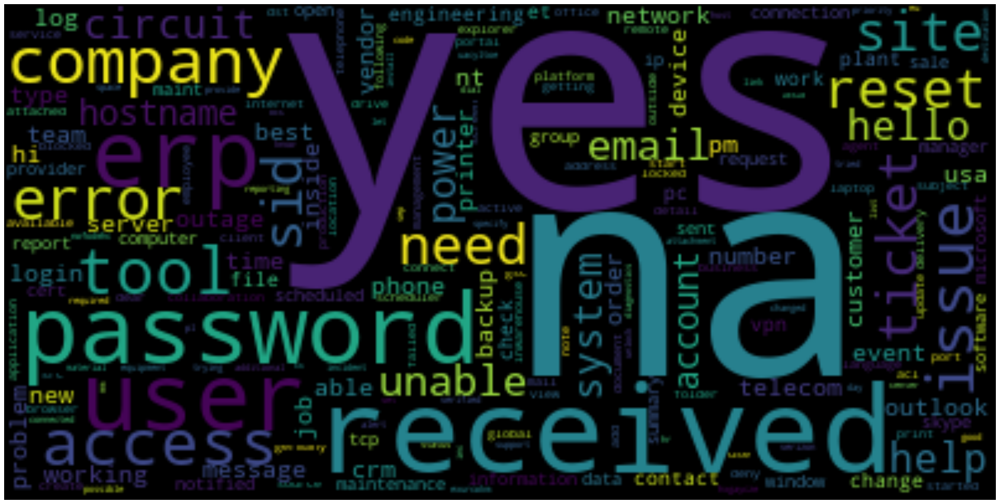

In [32]:
plot_cloud(' '.join(data[X0]))

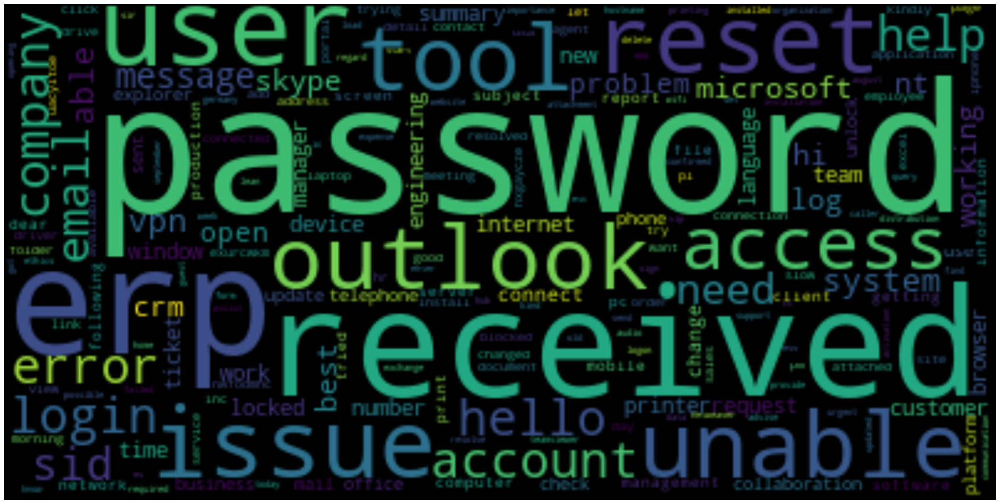

In [33]:
plot_cloud(' '.join(data_0[X0]))

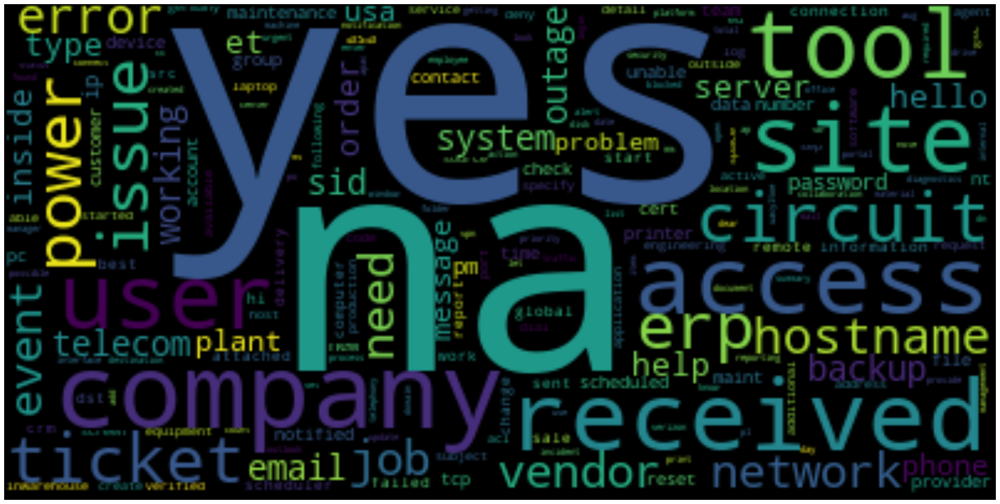

In [34]:
plot_cloud(' '.join(data_non_0[X0]))

All these word clouds are useful to detect some pattern of data having words like ***\_x000d\_*** needs to be removed. Word clouds can be used again and again to detect such data to clean data.

### Types of words used in particular group

Apart from finding the count of words per group, it is crucial to check what kind of words are used most in particular group. Some of the words can be specific to the group and can help to identify their group based on such keywords used

In [35]:
# Function to find common words for each defined category
def find_common_words_by_category(categories, N):
    common_words = {}
    for category in categories:
        category_text = [text for text in data[data[Y] == category][X0]]
        
        category_text = ' '.join(category_text).split()
        category_counter = Counter(category_text)
        cat_dict = {}
        for word in category_counter.most_common(N):
            cat_dict[word[0]] = word[1]
        common_words[category] = cat_dict
        
        word_statement = f"{category} has {common_words[category]}"
    return common_words

In [36]:
top_words = find_common_words_by_category(data[Y].unique(), 100)

In [37]:
def plot_cloud_freq(wordcloud_data):
    total_categories = len(wordcloud_data)
    fig = plt.figure(figsize=(20, 200))
    
    i = 0
    for category in wordcloud_data:
        wordcloud = cloud.generate_from_frequencies(wordcloud_data[category])
        ax= plt.subplot(int(total_categories / 2), 2, i + 1)
        im=ax.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(category, fontsize=16)
        i = i + 1
    plt.show()

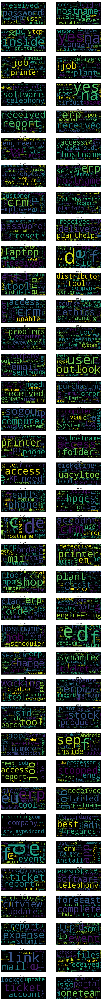

In [38]:
plot_cloud_freq(top_words)

Generating bigrams for further analysis

In [39]:
bigrams = list(nltk.bigrams(' '.join(data[X0]).split()))
bigrams_counter = Counter(bigrams)

bigram_list = []
for bigram in bigrams_counter.most_common():
    words = str(list(bigram[0]))
    count = bigram[1]
    bigram_list.append([words, count])

columns = ['bigram', 'count']
bigram_data = pd.DataFrame(bigram_list, columns=columns)

In [40]:
bigram_data.head()

,bigram,count
0,"['yes', 'na']",1559
1,"['received', 'hello']",445
2,"['backup', 'circuit']",438
3,"['telecom', 'vendor']",318
4,"['engineering', 'tool']",300


In [55]:
configure_plotly_browser_state()

fig = px.bar(bigram_data[:20], x='bigram', y='count', title='Counts of top bigrams', template='plotly_white', labels={'ngram': 'Bigram', 'count': 'Count'})
fig.show()

Removing unwanted set of words like yes, na, received also greeting words like hi, hello would be much beneficial as they create no sense what so ever

In [42]:
bigram_data[bigram_data.apply(lambda x: x['bigram'].find('aacount') != -1, axis = 1)]

,bigram,count
38193,"['object', 'aacount']",1
38194,"['aacount', 'plant']",1


In [64]:
text = [[text for text in doc.split()] for doc in data[X0]]

In [118]:
import gensim
from gensim import corpora
from gensim.utils import simple_preprocess

from gensim.models import Word2Vec
from sklearn.manifold import TSNE

In [60]:
# Creating dictionary
dictionary = corpora.Dictionary(text)
print(dictionary)

Dictionary(11055 unique tokens: ['able', 'ad', 'advised', 'caller', 'check']...)


In [61]:
print(dictionary.token2id)

{'able': 0, 'ad': 1, 'advised': 2, 'caller': 3, 'check': 4, 'checked': 5, 'confirmed': 6, 'details': 7, 'employee': 8, 'issue': 9, 'login': 10, 'manager': 11, 'password': 12, 'reset': 13, 'resolved': 14, 'user': 15, 'verified': 16, 'advise': 17, 'appearing': 18, 'calendar': 19, 'correct': 20, 'etc': 21, 'hello': 22, 'kind': 23, 'meetings': 24, 'outlook': 25, 'received': 26, 'skype': 27, 'somebody': 28, 'team': 29, 'best': 30, 'hi': 31, 'log': 32, 'nt': 33, 'vpn': 34, 'access': 35, 'hr': 36, 'page': 37, 'tool': 38, 'unable': 39, 'error': 40, 'engineering': 41, 'com': 42, 'company': 43, 'critical': 44, 'data': 45, 'erpdata': 46, 'event': 47, 'hostname': 48, 'mountpoint': 49, 'oracle': 50, 'perpsrpsad': 51, 'sid': 52, 'srpsad': 53, 'threshold': 54, 'value': 55, 'employment': 56, 'enter': 57, 'new': 58, 'non': 59, 'status': 60, 'ticket': 61, 'users': 62, 'add': 63, 'disable': 64, 'ins': 65, 'inplant': 66, 'update': 67, 'connected': 68, 'reports': 69, 'says': 70, 'submit': 71, 'correctly': 

In [66]:
# Tokenizing documents
tokenized_list = [simple_preprocess(doc) for doc in data[X0]]

# Creating corpus
ats_dictionary = corpora.Dictionary()
ats_corpus = [ats_dictionary.doc2bow(doc, allow_update=True) for doc in tokenized_list]

In [126]:
VECTOR_SIZE = 100

model = Word2Vec(text, sg=1, min_count=1, size=VECTOR_SIZE)

In [128]:
model.wv.similarity('job', 'email')

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



0.23692138

In [129]:
model.wv.similarity('job', 'scheduler')

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



0.98137724

In [130]:
model.wv.similarity('job', 'schedule')

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



0.5466638

In [131]:
model.wv.most_similar('job')[:5]

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



[('scheduler', 0.9813772439956665),
 ('abended', 0.9539673924446106),
 ('evening', 0.9394419193267822),
 ('rerun', 0.9359918832778931),
 ('snp', 0.9307662844657898)]

In [132]:
model.wv.most_similar('equipment')[:5]

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



[('dial', 0.9824822545051575),
 ('verified', 0.9583438038825989),
 ('tone', 0.9331783652305603),
 ('noi', 0.9251198768615723),
 ('exterior', 0.9093462824821472)]

In [133]:
model.wv.most_similar('circuit')[:5]

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



[('backup', 0.9350107908248901),
 ('australia', 0.9302505850791931),
 ('tikona', 0.9259053468704224),
 ('mbps', 0.9239413738250732),
 ('site', 0.9148435592651367)]

In [92]:
flat_text = [item for sublist in text for item in sublist]

In [119]:
def cosine_distance (model, word, target_list, num) :
  cosine_dict ={}
  word_list = []
  a = model[word]
  for item in target_list :
    if item != word :
      b = model[item]
      cos_sim = np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))
      cosine_dict[item] = cos_sim

  dist_sort=sorted(cosine_dict.items(), key=lambda dist: dist[1], reverse=True) ## in Descedning order
  for item in dist_sort:
    word_list.append((item[0], item[1]))

  return word_list[0:num]

In [120]:
cosine_distance(model, 'job', flat_text, 5)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



[('scheduler', 0.9789985),
 ('abended', 0.9626495),
 ('evening', 0.9323926),
 ('rerun', 0.93235254),
 ('bkbackup', 0.9269164)]

In [135]:
def display_closestwords_tsnescatterplot(model, word, size):
  arr = np.empty((0,size), dtype='f')
  word_labels = [word]
  close_words = model.wv.similar_by_word(word)
  arr = np.append(arr, np.array([model.wv[word]]), axis=0)
  for wrd_score in close_words:
    wrd_vector = model.wv[wrd_score[0]]
    word_labels.append(wrd_score[0])
    arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
  tsne = TSNE(n_components=2, random_state=0)
  np.set_printoptions(suppress=True)
  Y = tsne.fit_transform(arr)
  x_coords = Y[:, 0]
  y_coords = Y[:, 1]
  plt.scatter(x_coords, y_coords)
  for label, x, y in zip(word_labels, x_coords, y_coords):
    plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
  
  plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
  plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
  plt.show()

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



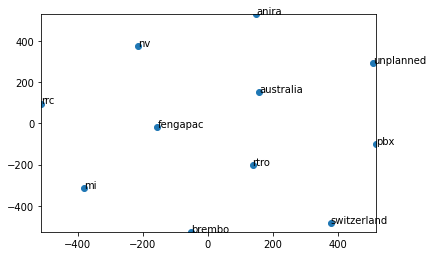

In [142]:
display_closestwords_tsnescatterplot(model, 'australia', VECTOR_SIZE)